In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import datamol as dm

from rdkit import Chem
from rdkit.Chem import AllChem, Descriptors, PandasTools


In [2]:
pd.options.display.max_columns = 50

In [3]:
data = pd.read_csv('data_clean.csv', index_col=0)
data.head()

,molecule_chembl_id,Ki,units,pKi,smiles,molecular_weight,n_hba,n_hbd,logp,passed
0,CHEMBL132806,57.0,nM,7.24,CC(C)CCn1cc2c(nc(NC(=O)Cc3ccccc3)n3nc(-c4ccco4...,429.191323,9,1,3.9613,True
1,CHEMBL336217,42.0,nM,7.38,CC(C)CCn1cc2c(nc(NC(=O)Cc3cccc4ccccc34)n3nc(-c...,479.206973,9,1,5.1145,True
2,CHEMBL134566,60.0,nM,7.22,O=C(Cc1ccccc1)Nc1nc2nn(CCCc3ccccc3)cc2c2nc(-c3...,477.191323,9,1,4.5480,True
3,CHEMBL435022,38.0,nM,7.42,CC(C)CCn1cc2c(nc(NC(=O)COc3ccccc3)n3nc(-c4ccco...,445.186238,10,1,3.7976,True
4,CHEMBL341376,423.0,nM,6.37,Cn1cc2c(nc(NC(=O)Cc3ccccc3)n3nc(-c4ccco4)nc23)n1,373.128723,9,1,2.4522,True


In [4]:
data = data[list(data.columns)[:5]]
data.head()

,molecule_chembl_id,Ki,units,pKi,smiles
0,CHEMBL132806,57.0,nM,7.24,CC(C)CCn1cc2c(nc(NC(=O)Cc3ccccc3)n3nc(-c4ccco4...
1,CHEMBL336217,42.0,nM,7.38,CC(C)CCn1cc2c(nc(NC(=O)Cc3cccc4ccccc34)n3nc(-c...
2,CHEMBL134566,60.0,nM,7.22,O=C(Cc1ccccc1)Nc1nc2nn(CCCc3ccccc3)cc2c2nc(-c3...
3,CHEMBL435022,38.0,nM,7.42,CC(C)CCn1cc2c(nc(NC(=O)COc3ccccc3)n3nc(-c4ccco...
4,CHEMBL341376,423.0,nM,6.37,Cn1cc2c(nc(NC(=O)Cc3ccccc3)n3nc(-c4ccco4)nc23)n1


In [5]:
PandasTools.AddMoleculeColumnToFrame(data, smilesCol='smiles', molCol='mols')
data.head()

,molecule_chembl_id,Ki,units,pKi,smiles,mols
0,CHEMBL132806,57.0,nM,7.24,CC(C)CCn1cc2c(nc(NC(=O)Cc3ccccc3)n3nc(-c4ccco4...,<rdkit.Chem.rdchem.Mol object at 0x00000288654...
1,CHEMBL336217,42.0,nM,7.38,CC(C)CCn1cc2c(nc(NC(=O)Cc3cccc4ccccc34)n3nc(-c...,<rdkit.Chem.rdchem.Mol object at 0x00000288654...
2,CHEMBL134566,60.0,nM,7.22,O=C(Cc1ccccc1)Nc1nc2nn(CCCc3ccccc3)cc2c2nc(-c3...,<rdkit.Chem.rdchem.Mol object at 0x00000288654...
3,CHEMBL435022,38.0,nM,7.42,CC(C)CCn1cc2c(nc(NC(=O)COc3ccccc3)n3nc(-c4ccco...,<rdkit.Chem.rdchem.Mol object at 0x00000288654...
4,CHEMBL341376,423.0,nM,6.37,Cn1cc2c(nc(NC(=O)Cc3ccccc3)n3nc(-c4ccco4)nc23)n1,<rdkit.Chem.rdchem.Mol object at 0x00000288654...


In [6]:
DescriptorLabels=["MW", "LogP", "TPSA", "NumHA", "NumHD", "Chi0", "Chi1", "Kappa1", "Kappa2", "Kappa3",
                  "FractionCsp3", "NumRotBonds", "NumHetAtoms", "NumAroRings"]
descriptor_dict={"MW": Descriptors.MolWt, "LogP": Descriptors.MolLogP, "TPSA": Descriptors.TPSA, 
                "NumHA": Descriptors.NumHAcceptors, "NumHD": Descriptors.NumHDonors, "Chi0": Descriptors.Chi0,
                "Chi1": Descriptors.Chi1, "Kappa1": Descriptors.Kappa1, "Kappa2": Descriptors.Kappa2, 
                "Kappa3": Descriptors.Kappa3, "FractionCsp3": Descriptors.FractionCSP3, 
                "NumRotBonds": Descriptors.NumRotatableBonds, "NumHetAtoms": Descriptors.NumHeteroatoms,
                "NumAroRings": Descriptors.NumAromaticRings}

In [7]:
for name, descriptor_fn in descriptor_dict.items():
    data[name] = data['mols'].apply(descriptor_fn)

In [8]:
data.head()

,molecule_chembl_id,Ki,units,pKi,smiles,mols,MW,LogP,TPSA,NumHA,NumHD,Chi0,Chi1,Kappa1,Kappa2,Kappa3,FractionCsp3,NumRotBonds,NumHetAtoms,NumAroRings
0,CHEMBL132806,57.0,nM,7.24,CC(C)CCn1cc2c(nc(NC(=O)Cc3ccccc3)n3nc(-c4ccco4...,<rdkit.Chem.rdchem.Mol object at 0x00000288654...,429.484,3.9613,103.14,8,1,22.078775,15.563683,19.924168,8.256663,3.963826,0.260870,7,9,5
1,CHEMBL336217,42.0,nM,7.38,CC(C)CCn1cc2c(nc(NC(=O)Cc3cccc4ccccc34)n3nc(-c...,<rdkit.Chem.rdchem.Mol object at 0x00000288654...,479.544,5.1145,103.14,8,1,24.647689,17.546847,21.966968,8.919037,4.084820,0.222222,7,9,6
2,CHEMBL134566,60.0,nM,7.22,O=C(Cc1ccccc1)Nc1nc2nn(CCCc3ccccc3)cc2c2nc(-c3...,<rdkit.Chem.rdchem.Mol object at 0x00000288654...,477.528,4.5480,103.14,8,1,24.321416,17.725479,21.723919,9.455978,4.458031,0.148148,8,9,6
3,CHEMBL435022,38.0,nM,7.42,CC(C)CCn1cc2c(nc(NC(=O)COc3ccccc3)n3nc(-c4ccco...,<rdkit.Chem.rdchem.Mol object at 0x00000288654...,445.483,3.7976,112.37,9,1,22.785882,16.063683,20.679304,8.732929,4.403270,0.260870,8,10,5
4,CHEMBL341376,423.0,nM,6.37,Cn1cc2c(nc(NC(=O)Cc3ccccc3)n3nc(-c4ccco4)nc23)n1,<rdkit.Chem.rdchem.Mol object at 0x00000288654...,373.376,2.4522,103.14,8,1,19.087211,13.669836,16.184616,6.305183,2.784154,0.105263,4,9,5


In [9]:
columns = ['pKi'] + list(descriptor_dict.keys())

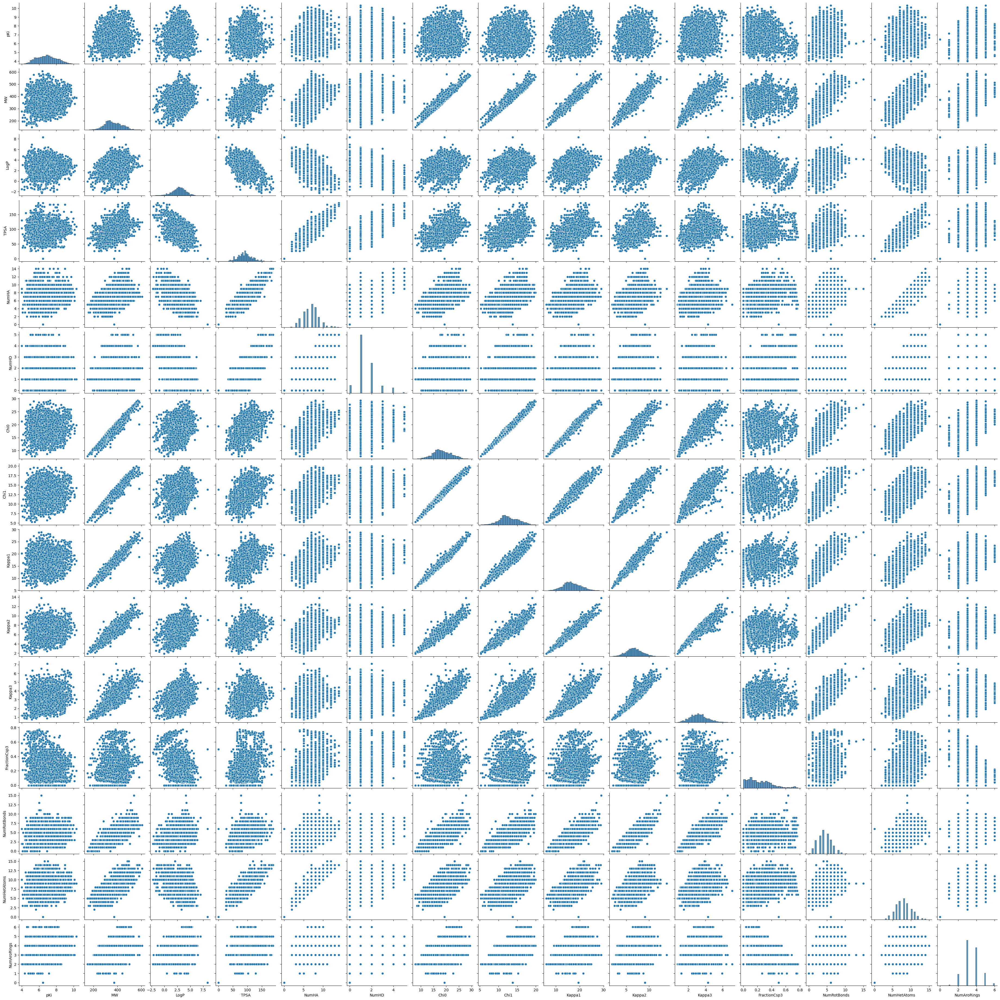

In [10]:
sns.pairplot(data[columns])

In [11]:
scaled_df = data.iloc[:, :6].copy()

In [12]:
scaled_df

,molecule_chembl_id,Ki,units,pKi,smiles,mols
0,CHEMBL132806,57.000,nM,7.24,CC(C)CCn1cc2c(nc(NC(=O)Cc3ccccc3)n3nc(-c4ccco4...,<rdkit.Chem.rdchem.Mol object at 0x00000288654...
1,CHEMBL336217,42.000,nM,7.38,CC(C)CCn1cc2c(nc(NC(=O)Cc3cccc4ccccc34)n3nc(-c...,<rdkit.Chem.rdchem.Mol object at 0x00000288654...
2,CHEMBL134566,60.000,nM,7.22,O=C(Cc1ccccc1)Nc1nc2nn(CCCc3ccccc3)cc2c2nc(-c3...,<rdkit.Chem.rdchem.Mol object at 0x00000288654...
3,CHEMBL435022,38.000,nM,7.42,CC(C)CCn1cc2c(nc(NC(=O)COc3ccccc3)n3nc(-c4ccco...,<rdkit.Chem.rdchem.Mol object at 0x00000288654...
4,CHEMBL341376,423.000,nM,6.37,Cn1cc2c(nc(NC(=O)Cc3ccccc3)n3nc(-c4ccco4)nc23)n1,<rdkit.Chem.rdchem.Mol object at 0x00000288654...
...,...,...,...,...,...,...
2938,CHEMBL5203105,0.081,nM,10.09,Cl.Cl.Nc1nc(C(=O)NCc2ccccn2)cn2c1nc1ccccc12,<rdkit.Chem.rdchem.Mol object at 0x00000288654...
2939,CHEMBL5181821,10200.000,nM,4.99,CNC(=O)[C@@]12C[C@@H]1[C@@H](n1cnc3c(NCCc4ccc(...,<rdkit.Chem.rdchem.Mol object at 0x00000288654...
2940,CHEMBL5183720,5050.000,nM,5.30,COc1cc(CCNc2nc(OCC(C)C)nc3c2ncn3[C@H]2[C@H](O)...,<rdkit.Chem.rdchem.Mol object at 0x00000288654...
2941,CHEMBL4521971,28.000,nM,7.55,Clc1cc2c(NC3CCCC3)nnc(-c3ccncc3)c2cc1Cl,<rdkit.Chem.rdchem.Mol object at 0x00000288654...


In [13]:
for col in columns:
    values = data[col].to_numpy()
    scaled_df[col] = (values - values.mean()) / values.std()

In [14]:
scaled_df

,molecule_chembl_id,Ki,units,pKi,smiles,mols,MW,LogP,TPSA,NumHA,NumHD,Chi0,Chi1,Kappa1,Kappa2,Kappa3,FractionCsp3,NumRotBonds,NumHetAtoms,NumAroRings
0,CHEMBL132806,57.000,nM,0.309876,CC(C)CCn1cc2c(nc(NC(=O)Cc3ccccc3)n3nc(-c4ccco4...,<rdkit.Chem.rdchem.Mol object at 0x00000288654...,0.899070,0.859424,0.413821,0.605760,-0.537902,1.026747,1.122862,0.870287,0.885728,0.794911,0.151829,1.417098,0.495428,1.618432
1,CHEMBL336217,42.000,nM,0.431568,CC(C)CCn1cc2c(nc(NC(=O)Cc3cccc4ccccc34)n3nc(-c...,<rdkit.Chem.rdchem.Mol object at 0x00000288654...,1.600470,1.722139,0.413821,0.605760,-0.537902,1.739084,1.916210,1.425336,1.278820,0.919068,-0.072060,1.417098,0.495428,2.706631
2,CHEMBL134566,60.000,nM,0.292492,O=C(Cc1ccccc1)Nc1nc2nn(CCCc3ccccc3)cc2c2nc(-c3...,<rdkit.Chem.rdchem.Mol object at 0x00000288654...,1.572224,1.298337,0.413821,0.605760,-0.537902,1.648611,1.987670,1.359297,1.597471,1.302037,-0.501181,1.944012,0.495428,2.706631
3,CHEMBL435022,38.000,nM,0.466337,CC(C)CCn1cc2c(nc(NC(=O)COc3ccccc3)n3nc(-c4ccco...,<rdkit.Chem.rdchem.Mol object at 0x00000288654...,1.123235,0.736959,0.773819,1.107097,-0.537902,1.222822,1.322882,1.075465,1.168372,1.245844,0.151829,1.944012,0.958446,1.618432
4,CHEMBL341376,423.000,nM,-0.446350,Cn1cc2c(nc(NC(=O)Cc3ccccc3)n3nc(-c4ccco4)nc23)n1,<rdkit.Chem.rdchem.Mol object at 0x00000288654...,0.112930,-0.269542,0.413821,0.605760,-0.537902,0.197214,0.365244,-0.145786,-0.272393,-0.415603,-0.749620,-0.163642,0.495428,1.618432
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2938,CHEMBL5203105,0.081,nM,2.787171,Cl.Cl.Nc1nc(C(=O)NCc2ccccn2)cn2c1nc1ccccc12,<rdkit.Chem.rdchem.Mol object at 0x00000288654...,0.363534,-0.134060,0.221147,-0.396913,0.509779,-0.515122,-0.414633,0.734676,0.725250,0.355894,-1.018651,-0.690556,0.495428,0.530233
2939,CHEMBL5181821,10200.000,nM,-1.645882,CNC(=O)[C@@]12C[C@@H]1[C@@H](n1cnc3c(NCCc4ccc(...,<rdkit.Chem.rdchem.Mol object at 0x00000288654...,1.670092,-1.930111,2.782860,2.109770,3.652821,1.810447,1.637018,1.738153,1.053455,0.333300,1.411207,1.944012,1.884483,-0.557965
2940,CHEMBL5183720,5050.000,nM,-1.376422,COc1cc(CCNc2nc(OCC(C)C)nc3c2ncn3[C@H]2[C@H](O)...,<rdkit.Chem.rdchem.Mol object at 0x00000288654...,1.460330,-0.501230,1.647874,1.608433,2.605140,1.554605,1.444387,1.616588,1.278282,0.951043,1.778526,2.470925,0.958446,-0.557965
2941,CHEMBL4521971,28.000,nM,0.579336,Clc1cc2c(NC3CCCC3)nnc(-c3ccncc3)c2cc1Cl,<rdkit.Chem.rdchem.Mol object at 0x00000288654...,-0.084852,1.900637,-1.631493,-1.399586,-0.537902,-0.515122,-0.414633,-0.302455,-0.135854,-0.278227,0.249781,-0.690556,-0.893627,-0.557965


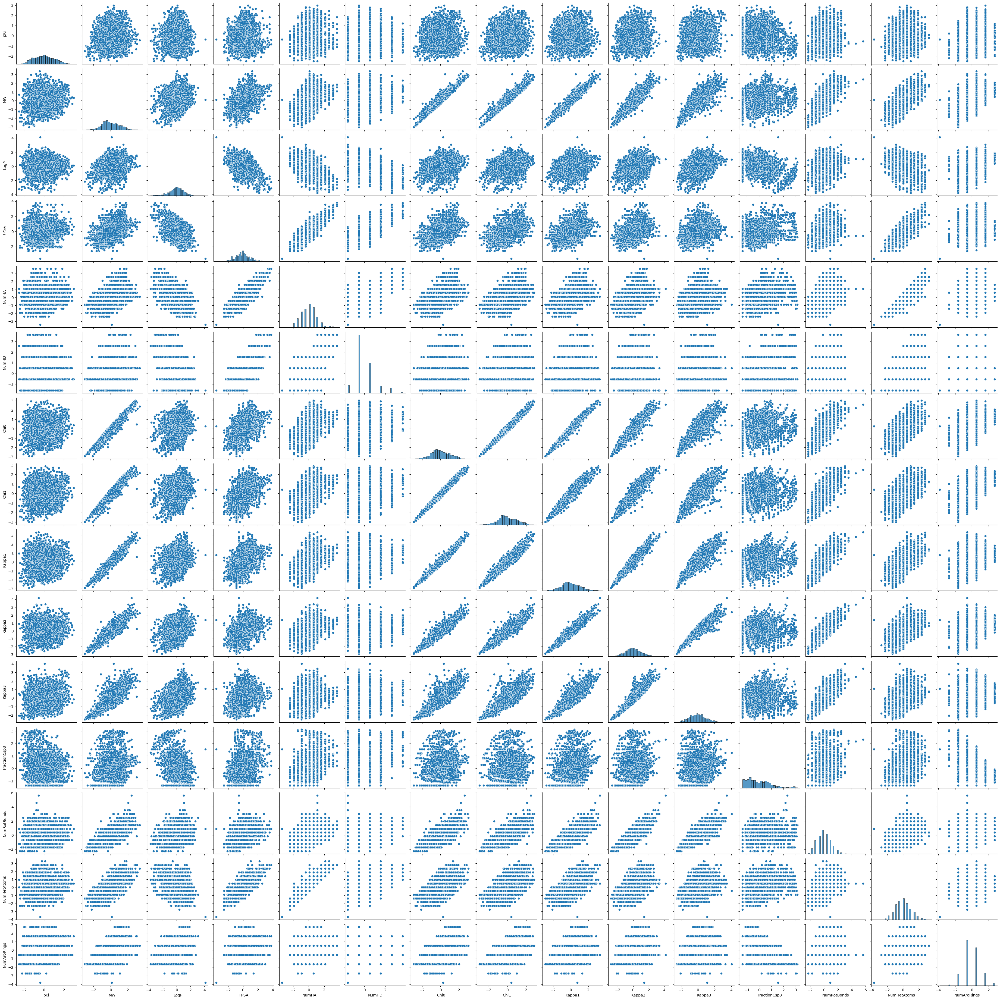

In [15]:
sns.pairplot(scaled_df[columns])

In [26]:
pivot = data[columns].corr()

In [27]:
pivot

,pKi,MW,LogP,TPSA,NumHA,NumHD,Chi0,Chi1,Kappa1,Kappa2,Kappa3,FractionCsp3,NumRotBonds,NumHetAtoms,NumAroRings
pKi,1.000000,0.061163,0.063470,0.099802,0.089220,-0.109359,0.082719,0.085020,0.065415,0.098887,0.146977,-0.214411,0.080181,0.065763,0.192110
MW,0.061163,1.000000,0.239802,0.508021,0.559968,0.208633,0.968834,0.959239,0.961954,0.900293,0.785477,0.275621,0.747040,0.744623,0.454804
LogP,0.063470,0.239802,1.000000,-0.474451,-0.437085,-0.396248,0.236484,0.273778,0.229403,0.323528,0.358324,-0.393529,0.197879,-0.291381,0.370509
TPSA,0.099802,0.508021,-0.474451,1.000000,0.806305,0.672131,0.516684,0.505127,0.483192,0.405766,0.307454,0.253310,0.429885,0.795840,0.221163
NumHA,0.089220,0.559968,-0.437085,0.806305,1.000000,0.364032,0.536924,0.544482,0.497573,0.407652,0.270439,0.370564,0.462921,0.853352,0.323163
NumHD,-0.109359,0.208633,-0.396248,0.672131,0.364032,1.000000,0.183006,0.170151,0.204266,0.159946,0.125287,0.284428,0.203095,0.397367,-0.148274
Chi0,0.082719,0.968834,0.236484,0.516684,0.536924,0.183006,1.000000,0.987495,0.981192,0.927550,0.816634,0.248279,0.774659,0.698311,0.478314
Chi1,0.085020,0.959239,0.273778,0.505127,0.544482,0.170151,0.987495,1.000000,0.950956,0.910937,0.779182,0.200536,0.765389,0.670016,0.556314
Kappa1,0.065415,0.961954,0.229403,0.483192,0.497573,0.204266,0.981192,0.950956,1.000000,0.962292,0.876552,0.330809,0.814179,0.678679,0.342347
Kappa2,0.098887,0.900293,0.323528,0.405766,0.407652,0.159946,0.927550,0.910937,0.962292,1.000000,0.939583,0.241581,0.866130,0.555723,0.324800


<Axes: >

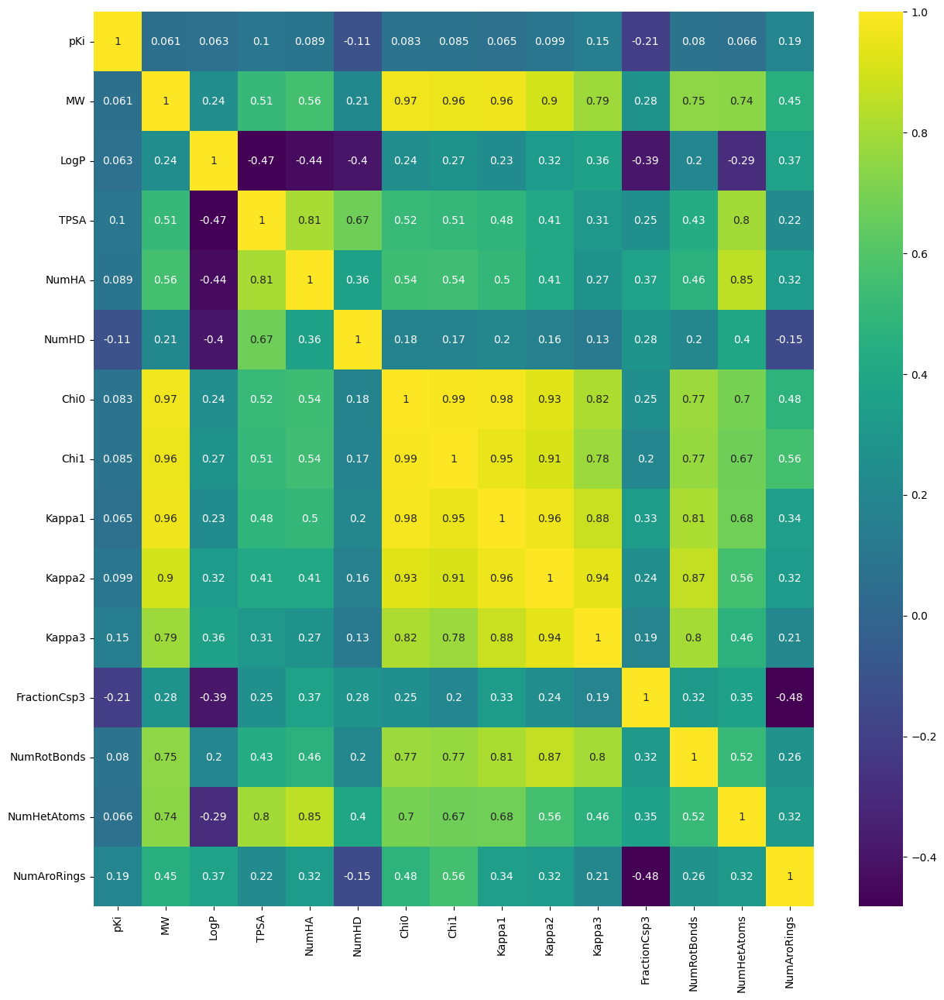

In [35]:
plt.figure(figsize=(15, 15))
sns.heatmap(pivot, cmap='viridis', annot=True)

In [ ]:
sns.he